## Setup

In [1]:
# Base libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
# NetworkX
import networkx as nx
import osmnx as ox
# OS environment setup
from local_directories import *

In [2]:
# Reset random seeds
random_seed = 2674
# Other
neighbourhood_min_nodes = 8
max_distance = 500

## Load data

In [3]:
# Load Leciester's graph
leicester_osmnx_graph = ox.io.load_graphml(bulk_storage_directory + "/osmnx/raw_excluded/leicester-1864.graphml")
leicester_osmnx_graph_prj = ox.project_graph(leicester_osmnx_graph)

In [4]:
len(list(leicester_osmnx_graph.nodes))

13293

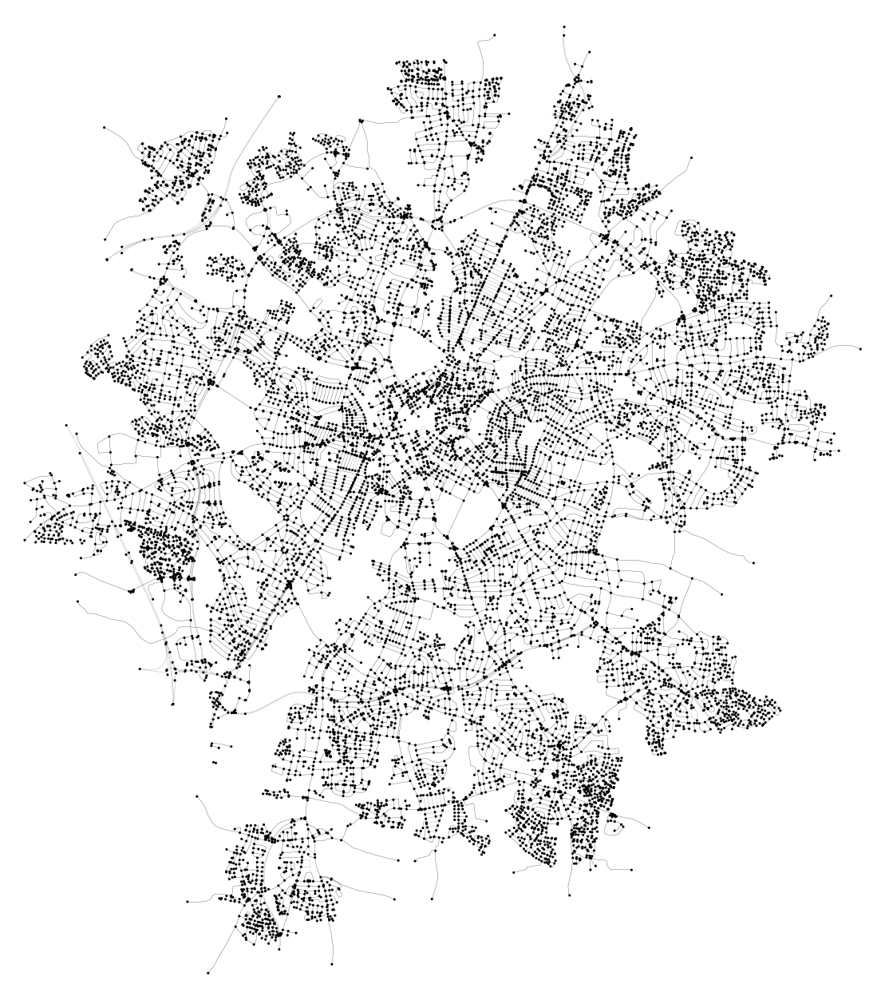

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [5]:
ox.plot_graph(
    leicester_osmnx_graph_prj,
    node_size=5, node_color="#000000",
    edge_color="#000000", edge_linewidth=0.1,
    bgcolor="#ffffff",
    figsize=(16, 16))

In [6]:
# Convert graph to dataframe version
leicester_osmnx_graph_prj_df = None
for node in leicester_osmnx_graph_prj:
    node_dict = leicester_osmnx_graph_prj.nodes[node]
    node_dict["osmnx_node_id"] = int(node)
    # node_dict["osmnx_node_id"] = str(node)
    if leicester_osmnx_graph_prj_df is None:
        leicester_osmnx_graph_prj_df = pd.DataFrame.from_dict([node_dict])
    else:
        leicester_osmnx_graph_prj_df = pd.concat([leicester_osmnx_graph_prj_df, pd.DataFrame.from_dict([node_dict])])
leicester_osmnx_graph_prj_df.head()

,y,x,street_count,elevation,elevation_aster,elevation_srtm,lon,lat,osmnx_node_id,ref,highway
0,5.829804e+06,622151.977595,3,72.0,35,72,-1.196195,52.604506,194739,NaN,NaN
0,5.829991e+06,622098.041002,3,72.0,45,72,-1.196922,52.606196,1551014281,NaN,NaN
0,5.828827e+06,622259.813792,2,79.0,57,79,-1.194965,52.595696,326312,21,motorway_junction
0,5.830107e+06,622077.742140,3,79.0,43,79,-1.197179,52.607245,326320,21,motorway_junction
0,5.829673e+06,622220.645785,3,74.0,35,74,-1.195230,52.603314,2627867454,NaN,NaN


In [7]:
# Load Leciester's embeddings
leicester_emb_df = pd.read_csv(this_repo_directory + "/data/leicester-1864_emb_gnnuf_model_v0-5.csv")
leicester_emb_df.head()

,osmnx_node_id,EMB000,EMB001
0,337976,-0.212304,-0.563564
1,337979,-0.322662,-0.882213
2,337983,-0.009132,0.948856
3,337985,-0.136350,0.965531
4,337986,-0.203456,0.447374


## Explore embeddings

In [8]:
fig = px.scatter(
    leicester_emb_df,
    x="EMB000",
    y="EMB001",
    hover_data=['osmnx_node_id'],
    width=800, height=800
)
fig.update_layout({"plot_bgcolor": "#ffffff"})
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.show()

In [9]:
for node in leicester_osmnx_graph_prj.nodes:
    if len(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB000"].values) == 0:
        leicester_osmnx_graph_prj.nodes[node]["EMB000"] = None
        leicester_osmnx_graph_prj.nodes[node]["EMB001"] = None
    else:
        leicester_osmnx_graph_prj.nodes[node]["EMB000"] = float(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB000"].values)
        leicester_osmnx_graph_prj.nodes[node]["EMB001"] = float(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB001"].values)

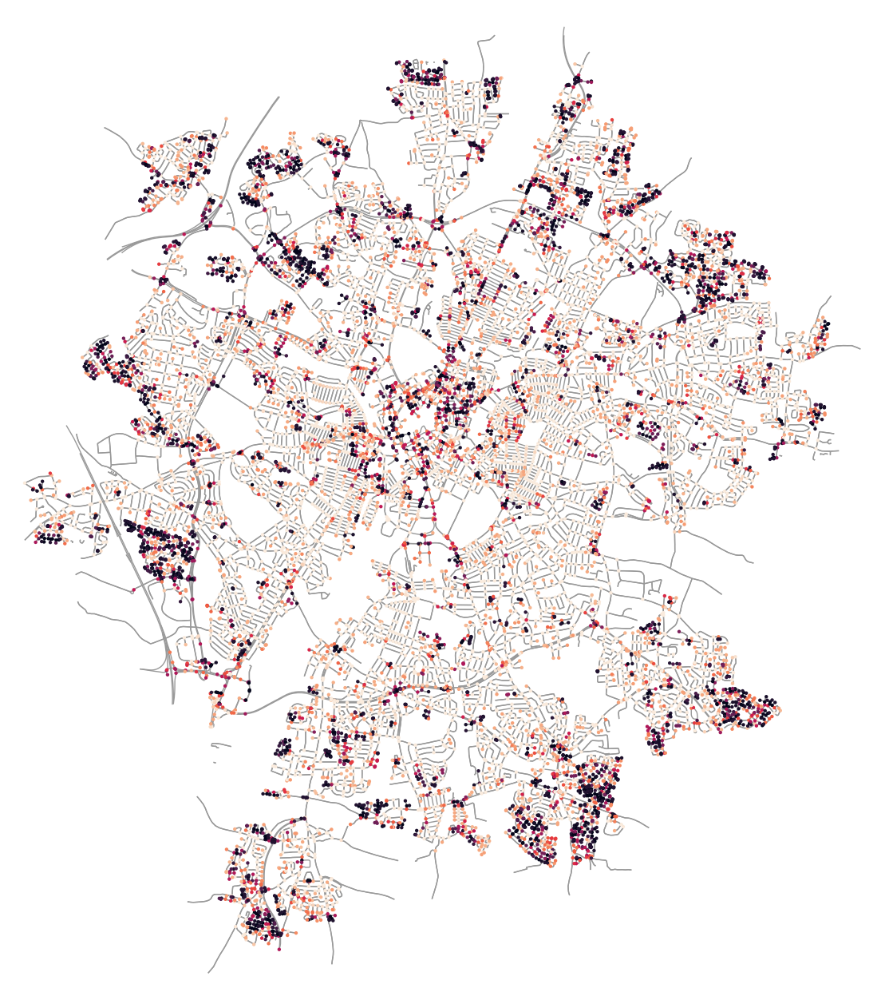

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [10]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["EMB000"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=10, bgcolor="#ffffff",
    figsize=(16, 16))

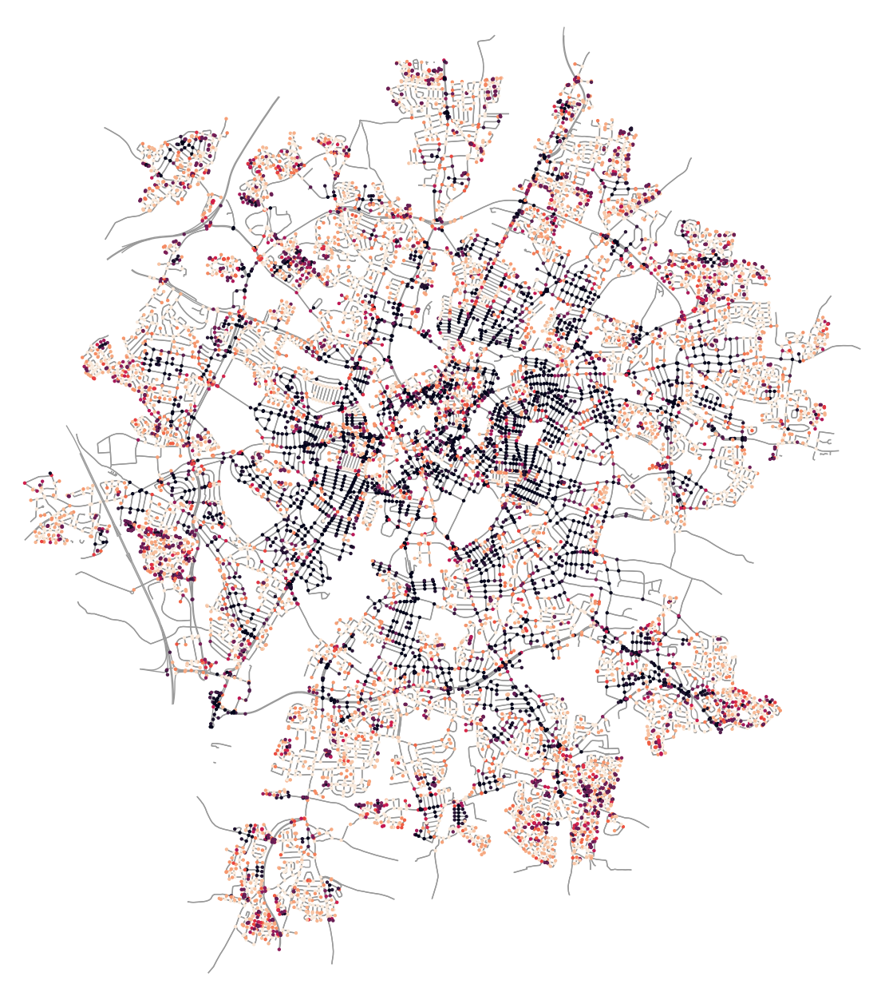

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [11]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["EMB001"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=10, bgcolor="#ffffff",
    figsize=(16, 16))

## Correlations with node and ego-graph stats

Checking correlations between node and ego-graph pooled embeddings, and OSMnx statistics for the nodes within the city-wide network, the nodes within their ego-graph used to create the embeddings, and the basic stats for the ego-graph used to create the embeddings

In [12]:
leicester_emb_stats_for_corr = \
    leicester_emb_df[["osmnx_node_id", "EMB000", "EMB001"]].merge(
    # Ego-graph pooled embeddings
        pd.read_csv(this_repo_directory +
            "/data/leicester-1864_emb-pool_gnnuf_model_v0-5.csv"
            ).rename(columns={"EMB000":"EMB000pooled", "EMB001":"EMB001pooled"}),
        on="osmnx_node_id"
    ).merge(
    # Centrality including node-based and ego-graph-based
        pd.read_csv(this_repo_directory +
            "/data/leicester-1864_stats_node_centrality_with_egograph_dist500.csv"
            ).rename(columns={"node_id":"osmnx_node_id"}),
        on="osmnx_node_id"
    ).merge(
    # Ego-graph basic stats
        pd.read_csv(this_repo_directory +
            "/data/leicester-1864_stats_egograph_basic_dist500.csv"
            ).rename(columns={"node_id":"osmnx_node_id"}
            ).dropna(subset=["osmnx_node_id"])[
            ["osmnx_node_id","n", "m", "k_avg", "edge_length_total", "edge_length_avg",
            "streets_per_node_avg", "intersection_count", "street_length_total",
            "street_segment_count", "street_length_avg", "circuity_avg"]],
        on="osmnx_node_id"
    )

In [13]:
leicester_emb_stats_for_corr.head()

,osmnx_node_id,EMB000,EMB001,EMB000pooled,EMB001pooled,closeness_networkwide,betweenness_networkwide,closeness_egograph,betweenness_egograph,n,m,k_avg,edge_length_total,edge_length_avg,streets_per_node_avg,intersection_count,street_length_total,street_segment_count,street_length_avg,circuity_avg
0,337976,-0.212304,-0.563564,-0.214178,0.073930,0.000000,0.000000,0.000000,0.000000,11.0,11.0,2.0,1261.861,114.714636,3.0,11.0,1261.861,11.0,114.714636,1.038343
1,337979,-0.322662,-0.882213,-0.112598,-0.131984,0.000150,0.000149,0.166667,0.106061,13.0,13.0,2.0,2126.471,163.574692,3.0,13.0,2126.471,13.0,163.574692,1.030988
2,337983,-0.009132,0.948856,-0.074082,0.194142,0.000285,0.000298,0.230769,0.115385,14.0,14.0,2.0,1870.996,133.642571,3.0,14.0,1870.996,14.0,133.642571,1.048630
3,337985,-0.136350,0.965531,-0.095356,0.193887,0.015656,0.000000,0.274725,0.000000,14.0,14.0,2.0,1815.929,129.709214,3.0,14.0,1815.929,14.0,129.709214,1.050192
4,337986,-0.203456,0.447374,-0.074082,0.194142,0.000249,0.000373,0.198381,0.096154,14.0,14.0,2.0,1870.996,133.642571,3.0,14.0,1870.996,14.0,133.642571,1.048630


In [14]:
print(leicester_emb_stats_for_corr.drop(columns=["osmnx_node_id"]).corr(method="kendall"))

                           EMB000    EMB001  EMB000pooled  EMB001pooled   
EMB000                   1.000000 -0.050229      0.414767     -0.117148  \
EMB001                  -0.050229  1.000000     -0.104923      0.393005   
EMB000pooled             0.414767 -0.104923      1.000000     -0.170566   
EMB001pooled            -0.117148  0.393005     -0.170566      1.000000   
closeness_networkwide    0.262182 -0.194019      0.364707     -0.337499   
betweenness_networkwide  0.242117 -0.025702      0.117417     -0.155388   
closeness_egograph       0.295632  0.135150      0.335473      0.202459   
betweenness_egograph     0.260210  0.097279      0.125096     -0.017320   
n                       -0.033401 -0.103946     -0.138311     -0.226253   
m                        0.013223 -0.100975     -0.068330     -0.212787   
k_avg                    0.260863  0.005101      0.376507      0.036726   
edge_length_total        0.210405 -0.130952      0.208221     -0.245809   
edge_length_avg          

In [15]:
# Double-checking difference with Spearman's rho
print(leicester_emb_stats_for_corr.drop(columns=["osmnx_node_id"]).corr(method="spearman"))

                           EMB000    EMB001  EMB000pooled  EMB001pooled   
EMB000                   1.000000 -0.077134      0.598860     -0.184985  \
EMB001                  -0.077134  1.000000     -0.161475      0.569221   
EMB000pooled             0.598860 -0.161475      1.000000     -0.270270   
EMB001pooled            -0.184985  0.569221     -0.270270      1.000000   
closeness_networkwide    0.388640 -0.292064      0.537505     -0.505571   
betweenness_networkwide  0.354346 -0.053826      0.170578     -0.225798   
closeness_egograph       0.437037  0.202000      0.490640      0.291693   
betweenness_egograph     0.380707  0.151481      0.181311     -0.027183   
n                       -0.049975 -0.157148     -0.204113     -0.329446   
m                        0.021164 -0.152845     -0.101058     -0.310380   
k_avg                    0.388864  0.003666      0.545514      0.045068   
edge_length_total        0.320914 -0.202643      0.310028     -0.358725   
edge_length_avg          

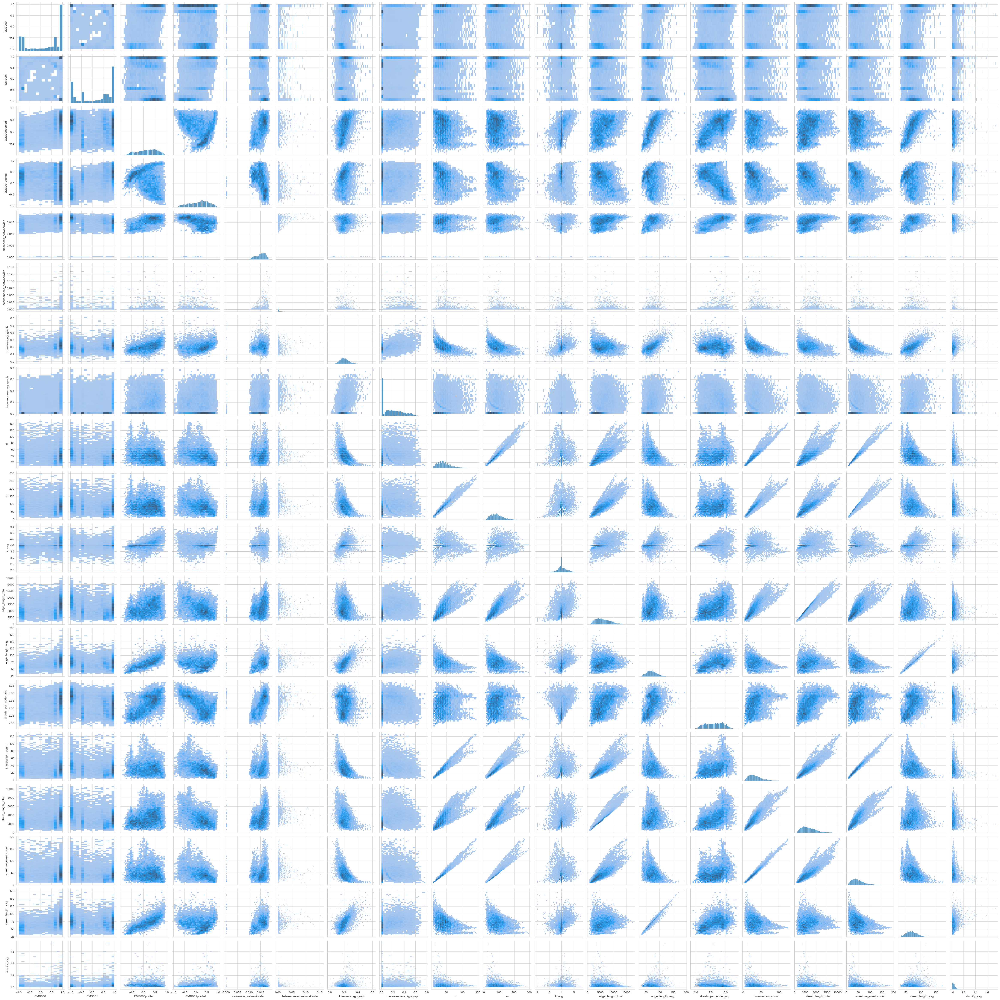

In [16]:
sns.pairplot(leicester_emb_stats_for_corr.drop(columns=["osmnx_node_id"]), kind="hist")

In [17]:
leicester_emb_stats_for_corr.to_csv(this_repo_directory + "/data/leicester-1864_emb_gnnuf_model_v0-5_incl-pool-with-stats.csv", index=False)

## Check specific nodes

Check specific nodes based on their embeddings and ego-graph structure

In [18]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 6782625866]

,osmnx_node_id,EMB000,EMB001
12711,6782625866,-0.999753,-0.943405


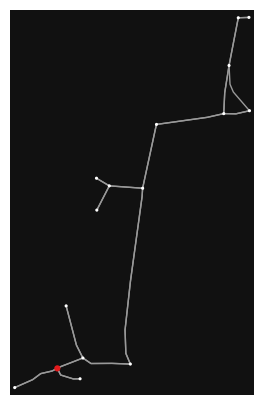

(<Figure size 500x500 with 1 Axes>, <Axes: >)

In [19]:
ego_6782625866 = nx.generators.ego_graph(
    leicester_osmnx_graph, 6782625866,
    radius=max_distance, undirected=True, distance="length")
ego_6782625866_prj = ox.project_graph(ego_6782625866)
ox.plot_graph(
    ego_6782625866_prj,
    node_size=[20 if node == 6782625866 else 5 for node in ego_6782625866_prj.nodes],
    node_color=["#e41a1c" if node == 6782625866 else "#ffffff" for node in ego_6782625866_prj.nodes],
    figsize=(5, 5)
)

In [20]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 354554417]

,osmnx_node_id,EMB000,EMB001
4733,354554417,-0.966505,0.982919


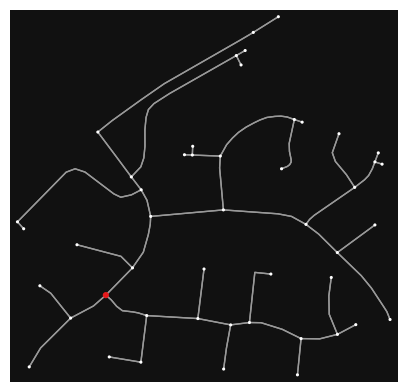

(<Figure size 500x500 with 1 Axes>, <Axes: >)

In [21]:
ego_354554417 = nx.generators.ego_graph(
    leicester_osmnx_graph, 354554417,
    radius=max_distance, undirected=True, distance="length")
ego_354554417_prj = ox.project_graph(ego_354554417)
ox.plot_graph(
    ego_354554417_prj,
    node_size=[20 if node == 354554417 else 5 for node in ego_354554417_prj.nodes],
    node_color=["#e41a1c" if node == 354554417 else "#ffffff" for node in ego_354554417_prj.nodes],
    figsize=(5, 5)
)

In [22]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 1179199412]

,osmnx_node_id,EMB000,EMB001
8021,1179199412,0.999113,0.99909


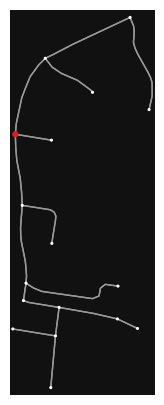

(<Figure size 500x500 with 1 Axes>, <Axes: >)

In [23]:
ego_1179199412 = nx.generators.ego_graph(
    leicester_osmnx_graph, 1179199412,
    radius=max_distance, undirected=True, distance="length")
ego_1179199412_prj = ox.project_graph(ego_1179199412)
ox.plot_graph(
    ego_1179199412_prj,
    node_size=[20 if node == 1179199412 else 5 for node in ego_1179199412_prj.nodes],
    node_color=["#e41a1c" if node == 1179199412 else "#ffffff" for node in ego_1179199412_prj.nodes],
    figsize=(5, 5)
)

In [24]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 2858142815]

,osmnx_node_id,EMB000,EMB001
11121,2858142815,0.002341,0.165836


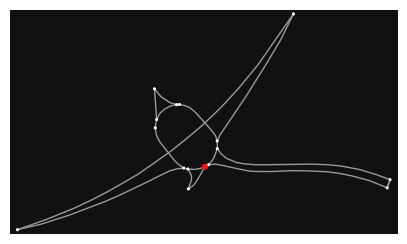

(<Figure size 500x500 with 1 Axes>, <Axes: >)

In [25]:
ego_2858142815 = nx.generators.ego_graph(
    leicester_osmnx_graph, 2858142815,
    radius=max_distance, undirected=True, distance="length")
ego_2858142815_prj = ox.project_graph(ego_2858142815)
ox.plot_graph(
    ego_2858142815_prj,
    node_size=[20 if node == 2858142815 else 5 for node in ego_2858142815_prj.nodes],
    node_color=["#e41a1c" if node == 2858142815 else "#ffffff" for node in ego_2858142815_prj.nodes],
    figsize=(5, 5)
)

In [26]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 296162322]

,osmnx_node_id,EMB000,EMB001
3845,296162322,0.99999,-0.999946


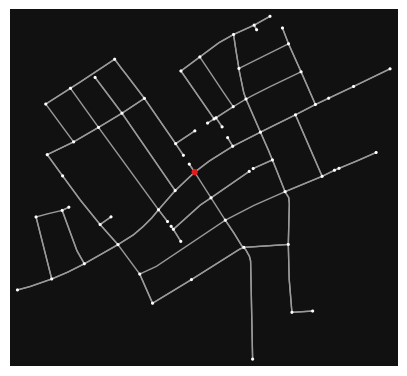

(<Figure size 500x500 with 1 Axes>, <Axes: >)

In [27]:
ego_296162322 = nx.generators.ego_graph(
    leicester_osmnx_graph, 296162322,
    radius=max_distance, undirected=True, distance="length")
ego_296162322_prj = ox.project_graph(ego_296162322)
ox.plot_graph(
    ego_296162322_prj,
    node_size=[20 if node == 296162322 else 5 for node in ego_296162322_prj.nodes],
    node_color=["#e41a1c" if node == 296162322 else "#ffffff" for node in ego_296162322_prj.nodes],
    figsize=(5, 5)
)

## Explore patterns

In [28]:
leicester_emb_patters_df = leicester_emb_df.copy()

### Embeddings clusters plot

In [29]:
from sklearn.cluster import DBSCAN
leicester_emb_df_clust = leicester_emb_df[["EMB000", "EMB001"]].dropna()
clust = DBSCAN(eps=0.11, min_samples=300)
leicester_emb_patters_df["clust"] = clust.fit_predict(leicester_emb_df_clust)
leicester_emb_patters_df["clust"].nunique()

8

In [30]:
colorbrewer_set1 = ["#e41a1c", "#377eb8", "#4daf4a", "#984ea3", "#ff7f00", "#ffff33", "#a65628", "#f781bf", "#999999"]
leicester_emb_patters_df["clust_colour"] = leicester_emb_patters_df["clust"].apply(lambda x: colorbrewer_set1[x])
leicester_emb_patters_df.head()

,osmnx_node_id,EMB000,EMB001,clust,clust_colour
0,337976,-0.212304,-0.563564,-1,#999999
1,337979,-0.322662,-0.882213,-1,#999999
2,337983,-0.009132,0.948856,-1,#999999
3,337985,-0.136350,0.965531,-1,#999999
4,337986,-0.203456,0.447374,-1,#999999


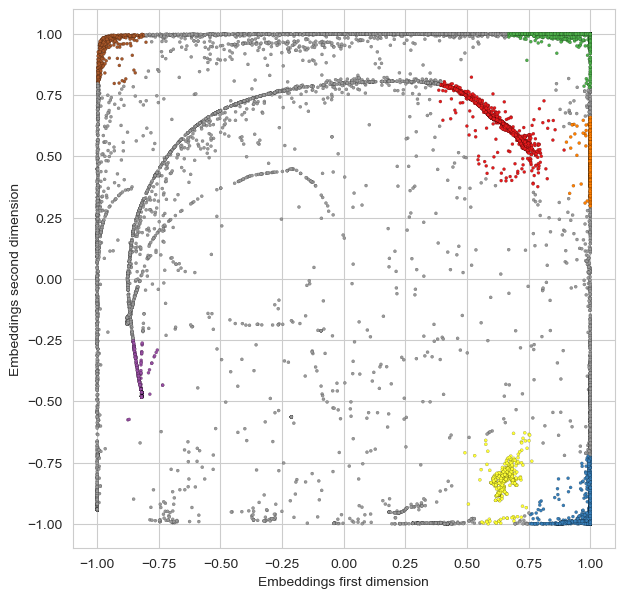

In [31]:
plt.figure(figsize=(7,7))
ax = plt.axes()
ax.set_facecolor("white")
plt.scatter(
    x=leicester_emb_patters_df.EMB000,
    y=leicester_emb_patters_df.EMB001,
    c=leicester_emb_patters_df.clust_colour,
    s=5, edgecolors='black', linewidth=0.1)
plt.xlabel("Embeddings first dimension")
plt.ylabel("Embeddings second dimension")
plt.show()

In [32]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=leicester_emb_patters_df.EMB000,
    y=leicester_emb_patters_df.EMB001,
    mode='markers',
    marker=dict(color=leicester_emb_patters_df.clust_colour)
))
fig.update_layout({"plot_bgcolor": "#ffffff"}, width=800, height=800)
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.show()

### Bivariate embedding plots

In [33]:
def bivariate_colour(x, limits):
    if x[0] is None or x[1] is None:
        return None
    else:
        if x[0] <= limits[0, 0]:
            if x[1] <= limits[1, 0]:
                # return "#e8e8e8"
                return "#e8e8e8"
            elif x[1] <= limits[1, 1]:
                # return "#cbb8d7"
                return "#e4acac"
            else:
                # return "#9972af"
                return "#c85a5a"
        if x[0] <= limits[0, 1]:
            if x[1] <= limits[1, 0]:
                # return "#e4d9ac"
                return "#b0d5df"
            elif x[1] <= limits[1, 1]:
                # return "#c8ada0"
                return "#ad9ea5"
            else:
                # return "#976b82"
                return "#985356"
        else:
            if x[1] <= limits[1, 0]:
                # return "#c8b35a"
                return "#64acbe"
            elif x[1] <= limits[1, 1]:
                # return "#af8e53"
                return "#627f8c"
            else:
                # return "#804d36"
                return "#574249"

leicester_emb_quantiles = leicester_emb_df[["EMB000", "EMB001"]].quantile([1/3, 2/3]).values.transpose()
leicester_emb_patters_df["bivariate_colour"] = leicester_emb_patters_df.apply(
    lambda x: bivariate_colour([x["EMB000"], x["EMB001"]], leicester_emb_quantiles), axis=1
)
leicester_emb_patters_df.head()

,osmnx_node_id,EMB000,EMB001,clust,clust_colour,bivariate_colour
0,337976,-0.212304,-0.563564,-1,#999999,#e8e8e8
1,337979,-0.322662,-0.882213,-1,#999999,#e8e8e8
2,337983,-0.009132,0.948856,-1,#999999,#985356
3,337985,-0.136350,0.965531,-1,#999999,#c85a5a
4,337986,-0.203456,0.447374,-1,#999999,#e4acac


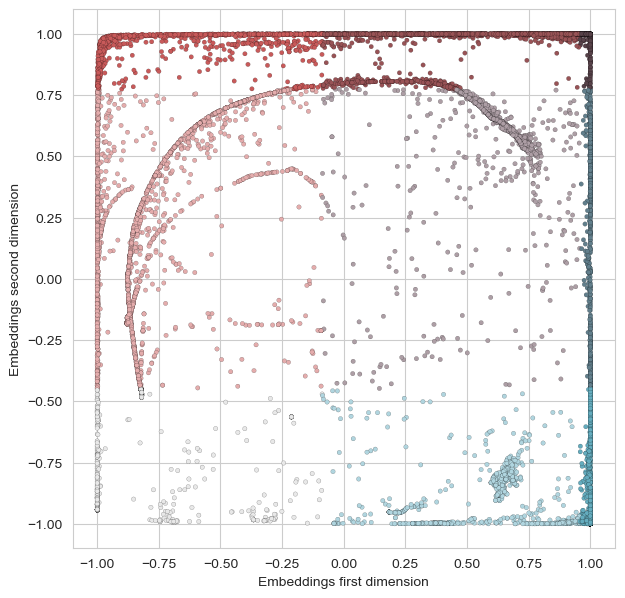

In [34]:
plt.figure(figsize=(7,7))
ax = plt.axes()
ax.set_facecolor("white")
plt.scatter(
    x=leicester_emb_patters_df.EMB000,
    y=leicester_emb_patters_df.EMB001,
    c=leicester_emb_patters_df.bivariate_colour,
    s=10, edgecolors='black', linewidth=0.1)
plt.xlabel("Embeddings first dimension")
plt.ylabel("Embeddings second dimension")
plt.show()

In [35]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=leicester_emb_patters_df.EMB000,
    y=leicester_emb_patters_df.EMB001,
    mode='markers',
    marker=dict(color=leicester_emb_patters_df.bivariate_colour)
))
fig.update_layout({"plot_bgcolor": "#ffffff"}, width=800, height=800)
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.show()

### Maps

In [36]:
leicester_osmnx_bivariate = leicester_osmnx_graph_prj.copy()

for node in leicester_osmnx_bivariate.nodes:
    node_bivariate_colour = leicester_emb_patters_df.loc[leicester_emb_patters_df["osmnx_node_id"] == node]
    if node_bivariate_colour.empty:
        leicester_osmnx_bivariate.nodes[node]["bivariate_colour"] = "#000000"
        leicester_osmnx_bivariate.nodes[node]["clust_colour"] = "#000000"
        leicester_osmnx_bivariate.nodes[node]["node_size"] = 1
    else:
        leicester_osmnx_bivariate.nodes[node]["bivariate_colour"] = node_bivariate_colour["bivariate_colour"].values[0]
        leicester_osmnx_bivariate.nodes[node]["clust_colour"] = node_bivariate_colour["clust_colour"].values[0]
        leicester_osmnx_bivariate.nodes[node]["node_size"] = 7

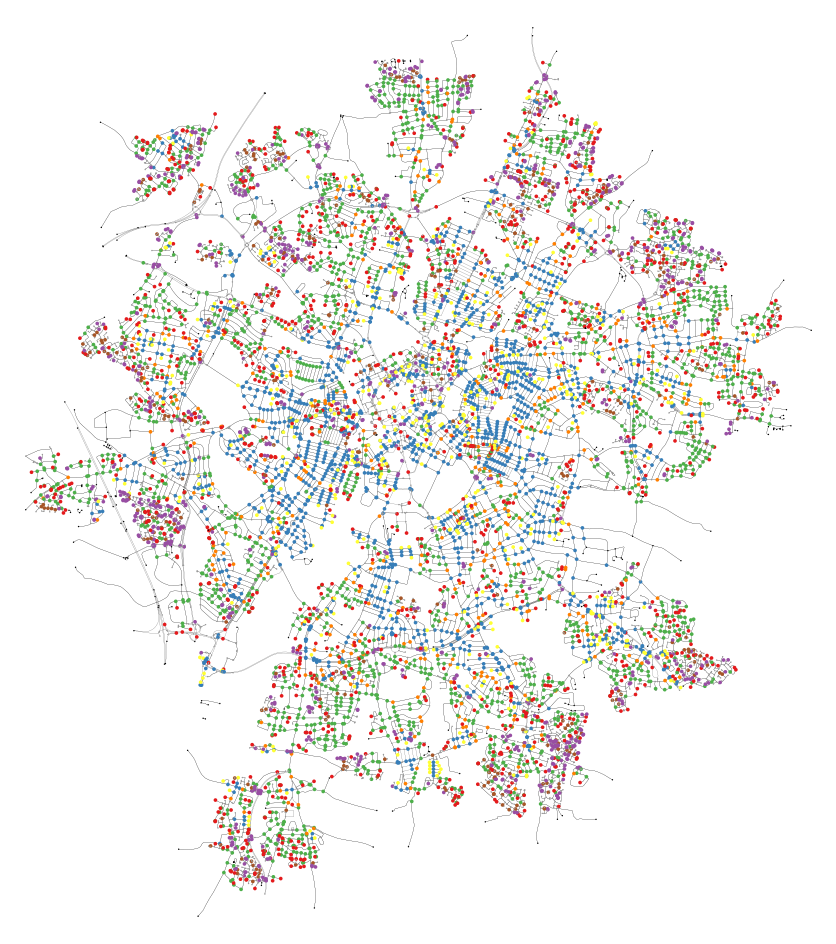

(<Figure size 1200x1200 with 1 Axes>, <Axes: >)

In [37]:
ox.plot_graph(
    leicester_osmnx_bivariate,
    node_color=[leicester_osmnx_bivariate.nodes[node]["clust_colour"] for node in leicester_osmnx_bivariate.nodes],
    node_size=[leicester_osmnx_bivariate.nodes[node]["node_size"]if leicester_osmnx_bivariate.nodes[node]["clust_colour"]!=colorbrewer_set1[-1] else 1 for node in leicester_osmnx_bivariate.nodes],
    bgcolor="#ffffff", edge_color="#000000", edge_linewidth=0.1,
    figsize=(12, 12))

In [38]:
# ox.plot_graph(
#     leicester_osmnx_bivariate,
#     node_color=[leicester_osmnx_bivariate.nodes[node]["clust_colour"] for node in leicester_osmnx_bivariate.nodes],
#     node_size=[leicester_osmnx_bivariate.nodes[node]["node_size"]*8 if leicester_osmnx_bivariate.nodes[node]["clust_colour"]!=colorbrewer_set1[-1] else 8 for node in leicester_osmnx_bivariate.nodes],
#     bgcolor="#ffffff", edge_color="#000000", edge_linewidth=0.1,
#     figsize=(48, 48))

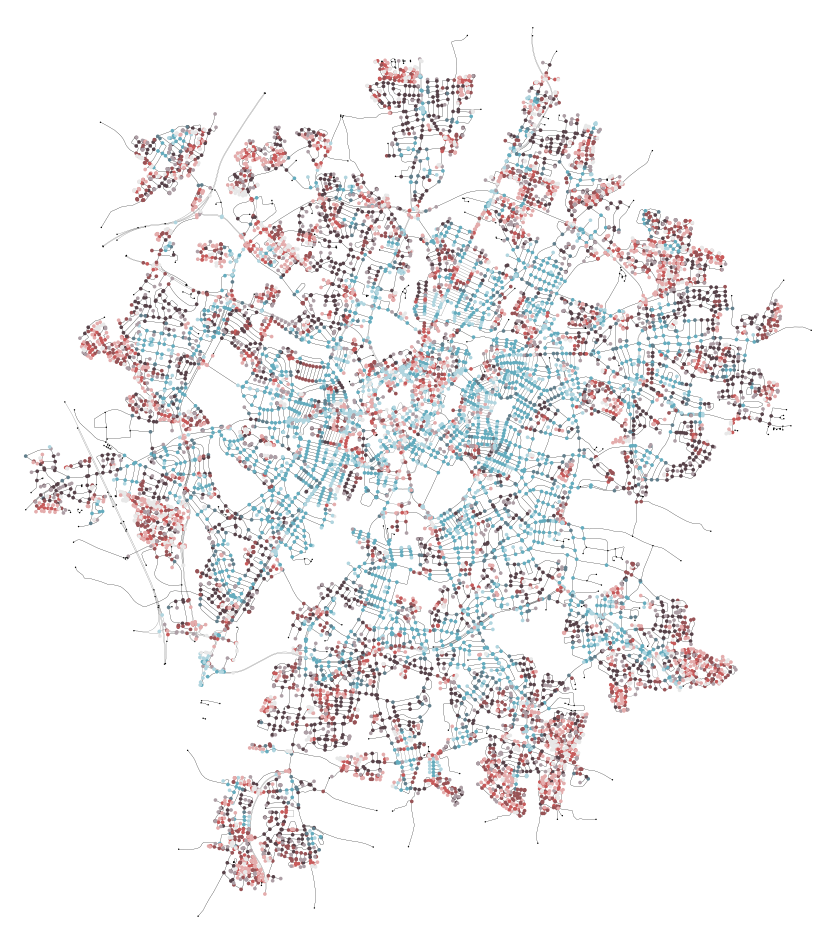

(<Figure size 1200x1200 with 1 Axes>, <Axes: >)

In [39]:
ox.plot_graph(
    leicester_osmnx_bivariate,
    node_color=[leicester_osmnx_bivariate.nodes[node]["bivariate_colour"] for node in leicester_osmnx_bivariate.nodes],
    node_size=[leicester_osmnx_bivariate.nodes[node]["node_size"] for node in leicester_osmnx_bivariate.nodes],
    bgcolor="#ffffff", edge_color="#000000", edge_linewidth=0.1,
    figsize=(12, 12))

In [40]:
# ox.plot_graph(
#     leicester_osmnx_bivariate,
#     node_color=[leicester_osmnx_bivariate.nodes[node]["bivariate_colour"] for node in leicester_osmnx_bivariate.nodes],
#     node_size=[leicester_osmnx_bivariate.nodes[node]["node_size"]*2 for node in leicester_osmnx_bivariate.nodes],
#     bgcolor="#ffffff", edge_color="#000000", edge_linewidth=0.1,
#     figsize=(24, 24))

In [41]:
import geopandas as gpd
leicester_gdf = gpd.GeoDataFrame(
    leicester_osmnx_graph_prj_df,
    geometry=gpd.points_from_xy(
        leicester_osmnx_graph_prj_df.lon,
        leicester_osmnx_graph_prj_df.lat
    ),
    crs="EPSG:4326"
).merge(leicester_emb_patters_df, on='osmnx_node_id', how='left')
leicester_gdf.head()

,y,x,street_count,elevation,elevation_aster,elevation_srtm,lon,lat,osmnx_node_id,ref,highway,geometry,EMB000,EMB001,clust,clust_colour,bivariate_colour
0,5.829804e+06,622151.977595,3,72.0,35,72,-1.196195,52.604506,194739,NaN,NaN,POINT (-1.19620 52.60451),NaN,NaN,NaN,NaN,NaN
1,5.829991e+06,622098.041002,3,72.0,45,72,-1.196922,52.606196,1551014281,NaN,NaN,POINT (-1.19692 52.60620),NaN,NaN,NaN,NaN,NaN
2,5.828827e+06,622259.813792,2,79.0,57,79,-1.194965,52.595696,326312,21,motorway_junction,POINT (-1.19497 52.59570),NaN,NaN,NaN,NaN,NaN
3,5.830107e+06,622077.742140,3,79.0,43,79,-1.197179,52.607245,326320,21,motorway_junction,POINT (-1.19718 52.60724),NaN,NaN,NaN,NaN,NaN
4,5.829673e+06,622220.645785,3,74.0,35,74,-1.195230,52.603314,2627867454,NaN,NaN,POINT (-1.19523 52.60331),0.435371,-0.637928,-1.0,#999999,#b0d5df


In [ ]:
leicester_gdf[leicester_gdf["clust_colour"]!=colorbrewer_set1[-1]].dropna(subset=["EMB000"]).explore(
    color="clust_colour",
    marker_kwds={"radius": 7}, style_kwds={"stroke": False},
    tiles="Stamen Toner"
)

In [ ]:
leicester_gdf[leicester_gdf["bivariate_colour"]!="#000000"].dropna(subset=["EMB000"]).explore(
    color="bivariate_colour",
    marker_kwds={"radius": 7}, style_kwds={"stroke": False},
    legend=True,
    tiles="Stamen Toner"
)

## Comparison: centrality plots and maps

In [ ]:
leicester_osmnx_centrality = leicester_osmnx_graph_prj.copy()

In [ ]:
leicester_centralities_networkwide_quantiles = leicester_emb_stats_for_corr[["closeness_networkwide", "betweenness_networkwide"]].quantile([1/3, 2/3]).values.transpose()
leicester_emb_stats_for_corr["bivariate_centrality_networkwide"] = leicester_emb_stats_for_corr.apply(
    lambda x: bivariate_colour([x["closeness_networkwide"], x["betweenness_networkwide"]], leicester_centralities_networkwide_quantiles), axis=1
)

In [ ]:
leicester_centralities_egograph_quantiles = leicester_emb_stats_for_corr[["closeness_egograph", "betweenness_egograph"]].quantile([1/3, 2/3]).values.transpose()
leicester_emb_stats_for_corr["bivariate_centrality_egograph"] = leicester_emb_stats_for_corr.apply(
    lambda x: bivariate_colour([x["closeness_egograph"], x["betweenness_egograph"]], leicester_centralities_egograph_quantiles), axis=1
)

In [ ]:
for node in leicester_osmnx_centrality.nodes:
    # networkwide
    leicester_osmnx_centrality.nodes[node]["closeness_networkwide"] = None
    leicester_osmnx_centrality.nodes[node]["betweenness_networkwide"] = None
    leicester_osmnx_centrality.nodes[node]["bivariate_centrality_networkwide"] = "#000000"
    # egograph
    leicester_osmnx_centrality.nodes[node]["closeness_egograph"] = None
    leicester_osmnx_centrality.nodes[node]["betweenness_egograph"] = None
    leicester_osmnx_centrality.nodes[node]["bivariate_centrality_egograph"] = "#000000"
    if node in leicester_emb_stats_for_corr["osmnx_node_id"].values:
        # networkwide
        leicester_osmnx_centrality.nodes[node]["closeness_networkwide"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "closeness_networkwide"].values[0]
        leicester_osmnx_centrality.nodes[node]["betweenness_networkwide"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "betweenness_networkwide"].values[0]
        leicester_osmnx_centrality.nodes[node]["bivariate_centrality_networkwide"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "bivariate_centrality_networkwide"].values[0]
        # egograph
        leicester_osmnx_centrality.nodes[node]["closeness_egograph"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "closeness_egograph"].values[0]
        leicester_osmnx_centrality.nodes[node]["betweenness_egograph"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "betweenness_egograph"].values[0]
        leicester_osmnx_centrality.nodes[node]["bivariate_centrality_egograph"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "bivariate_centrality_egograph"].values[0]

### City-wide centrality

In [ ]:
plt.figure(figsize=(7,7))
ax = plt.axes()
ax.set_facecolor("white")
ax.set_yscale('log')
plt.scatter(
    x=leicester_emb_stats_for_corr.closeness_networkwide,
    y=leicester_emb_stats_for_corr.betweenness_networkwide,
    c=leicester_emb_stats_for_corr.bivariate_centrality_networkwide,
    s=10, edgecolors='black', linewidth=0.1)
plt.xlabel("closeness_networkwide")
plt.ylabel("betweenness_networkwide")
plt.show()

In [ ]:
ox.plot_graph(
    leicester_osmnx_centrality,
    node_color=[leicester_osmnx_centrality.nodes[node]["bivariate_centrality_networkwide"] for node in leicester_osmnx_centrality.nodes],
    node_size=[1 if leicester_osmnx_centrality.nodes[node]["bivariate_centrality_networkwide"]=="#000000" else 7 for node in leicester_osmnx_centrality.nodes],
    bgcolor="#ffffff", edge_color="#000000", edge_linewidth=0.1,
    figsize=(12, 12))

### Ego-graph centrality

In [ ]:
plt.figure(figsize=(7,7))
ax = plt.axes()
ax.set_facecolor("white")
ax.set_yscale('log')
plt.scatter(
    x=leicester_emb_stats_for_corr.closeness_egograph,
    y=leicester_emb_stats_for_corr.betweenness_egograph,
    c=leicester_emb_stats_for_corr.bivariate_centrality_egograph,
    s=10, edgecolors='black', linewidth=0.1)
plt.xlabel("closeness_egograph")
plt.ylabel("betweenness_egograph")
plt.show()

In [ ]:
ox.plot_graph(
    leicester_osmnx_centrality,
    node_color=[leicester_osmnx_centrality.nodes[node]["bivariate_centrality_egograph"] for node in leicester_osmnx_centrality.nodes],
    node_size=[1 if leicester_osmnx_centrality.nodes[node]["bivariate_centrality_egograph"]=="#000000" else 7 for node in leicester_osmnx_centrality.nodes],
    bgcolor="#ffffff", edge_color="#000000", edge_linewidth=0.1,
    figsize=(12, 12))